In [1]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/


In [2]:
!kaggle datasets download -d puneet6060/intel-image-classification


Dataset URL: https://www.kaggle.com/datasets/puneet6060/intel-image-classification
License(s): copyright-authors


In [3]:
!unzip intel-image-classification.zip -d intel_data

Streaming output truncated to the last 5000 lines.
  inflating: intel_data/seg_train/seg_train/mountain/7506.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7537.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7539.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7551.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7560.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7565.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7578.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7581.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7586.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7647.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7652.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7654.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7662.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/767.jpg  
  inflating: intel_data/seg_train/seg_train/mountain/7

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras
from tensorflow.keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D,BatchNormalization
from tensorflow.keras.models import Sequential
from keras import callbacks
from keras.optimizers import Adam
import os
import matplotlib.cm as cm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
import random
import warnings
warnings.filterwarnings("ignore")

In [5]:
pred_dir='/content/intel_data/seg_pred/seg_pred'
train_dir='/content/intel_data/seg_train/seg_train'
test_dir='/content/intel_data/seg_test/seg_test'


In [6]:
os.listdir(train_dir)

['forest', 'street', 'mountain', 'sea', 'buildings', 'glacier']

In [7]:
os.listdir(test_dir)

['forest', 'street', 'mountain', 'sea', 'buildings', 'glacier']

In [8]:
os.listdir(pred_dir)

['18728.jpg',
 '608.jpg',
 '19346.jpg',
 '15863.jpg',
 '1834.jpg',
 '16328.jpg',
 '18596.jpg',
 '11890.jpg',
 '18033.jpg',
 '12879.jpg',
 '13795.jpg',
 '10173.jpg',
 '6806.jpg',
 '15747.jpg',
 '1992.jpg',
 '18297.jpg',
 '19174.jpg',
 '17231.jpg',
 '10391.jpg',
 '7800.jpg',
 '17440.jpg',
 '17157.jpg',
 '11533.jpg',
 '5914.jpg',
 '24255.jpg',
 '7796.jpg',
 '6727.jpg',
 '2812.jpg',
 '21172.jpg',
 '278.jpg',
 '23099.jpg',
 '18040.jpg',
 '13098.jpg',
 '10040.jpg',
 '4247.jpg',
 '8175.jpg',
 '5067.jpg',
 '8971.jpg',
 '13547.jpg',
 '10933.jpg',
 '18119.jpg',
 '1483.jpg',
 '8341.jpg',
 '19602.jpg',
 '22061.jpg',
 '20208.jpg',
 '2187.jpg',
 '4799.jpg',
 '16318.jpg',
 '14361.jpg',
 '12090.jpg',
 '4637.jpg',
 '17147.jpg',
 '14908.jpg',
 '19160.jpg',
 '6612.jpg',
 '1438.jpg',
 '23887.jpg',
 '3283.jpg',
 '21124.jpg',
 '19088.jpg',
 '227.jpg',
 '1973.jpg',
 '21958.jpg',
 '5945.jpg',
 '16327.jpg',
 '13252.jpg',
 '19572.jpg',
 '5107.jpg',
 '16866.jpg',
 '23279.jpg',
 '11120.jpg',
 '973.jpg',
 '7117.jp

In [9]:
#assigning the class_names
class_names=['buildings','forest',  'glacier', 'mountain', 'sea','street' ]
class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

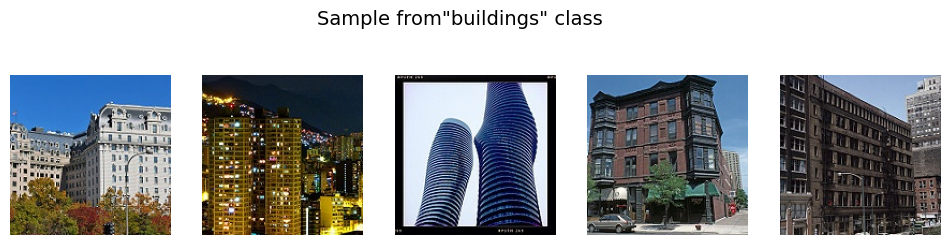

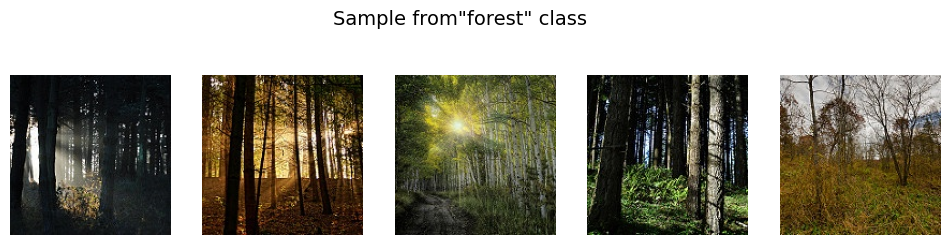

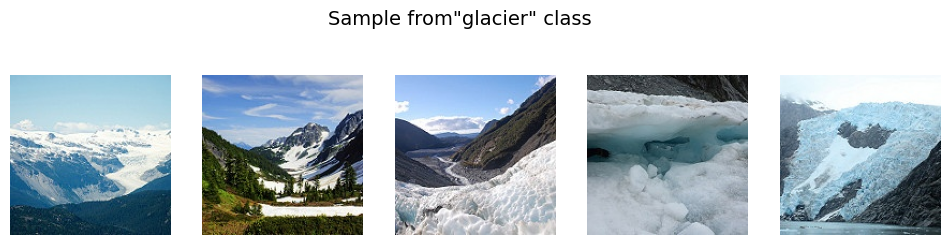

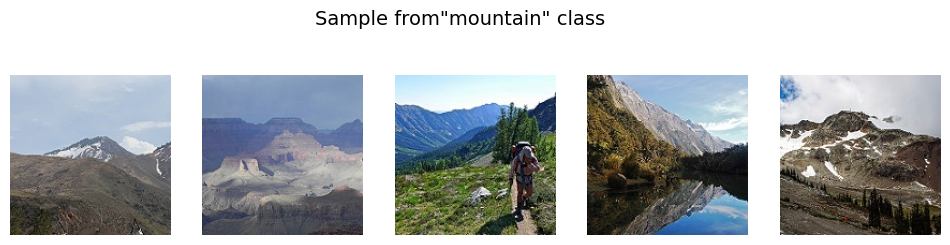

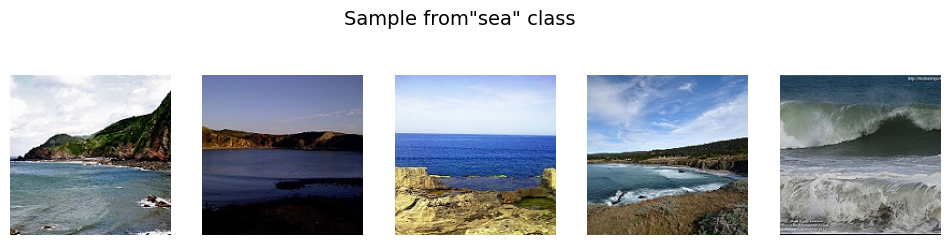

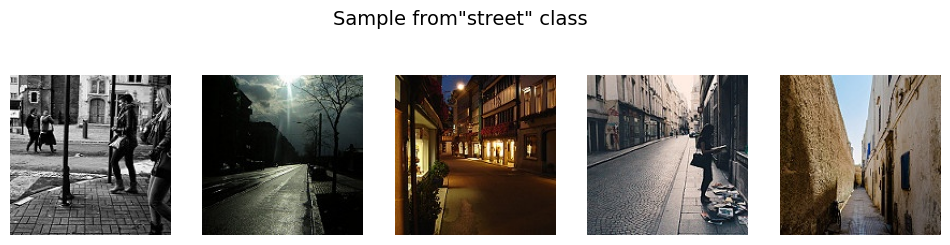

In [10]:
for img_class in class_names:
  class_dir=os.path.join(train_dir,img_class)
  image_path=os.listdir(class_dir)
  random_images=random.sample(image_path,k=5)

  fig,ax=plt.subplots(1,5,figsize=(12,3))
  plt.suptitle(f'Sample from"{img_class}" class',fontsize=14)

  for i,random_image in enumerate(random_images):
    image_path=os.path.join(class_dir,random_image)
    image=tf.keras.utils.load_img(image_path)

    ax[i].imshow(image)
    ax[i].axis('off')
  plt.subplots_adjust(hspace=-0.2)
  plt.show()
  print("\n")

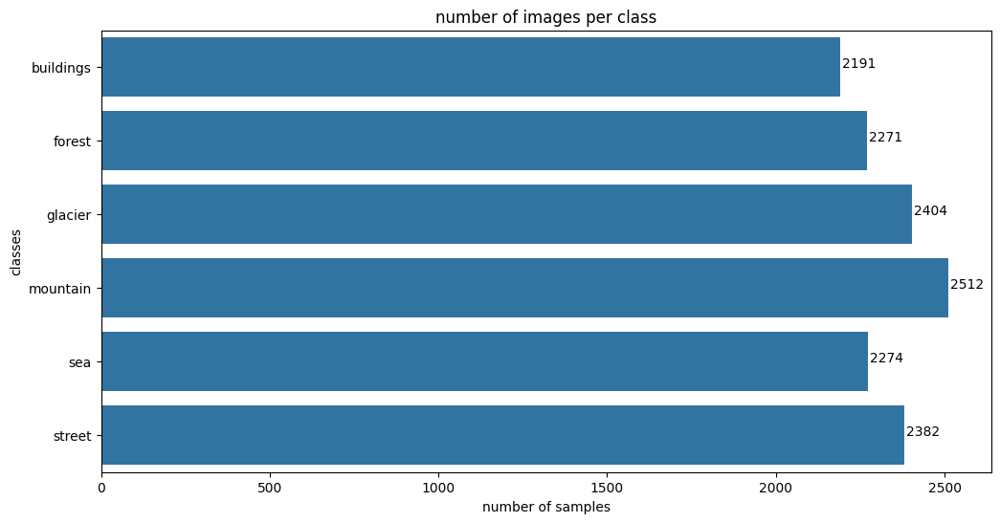

In [11]:
counts=[]
for img_class in class_names:
  class_dir=os.path.join(train_dir,img_class)
  counts.append(len(os.listdir(class_dir)))
plt.figure(figsize=(12,6))
ax=sns.barplot(x=counts,y=class_names)

for i,p in enumerate(ax.patches):
  width=p.get_width()
  ax.text(width+5,p.get_y()+p.get_height()/2.,'{}'.format(counts[i]))
plt.title("number of images per class")
plt.xlabel("number of samples")
plt.ylabel("classes")
plt.show()

In [12]:
image_data=[]
for img_class in class_names:
  class_dir=os.path.join(train_dir,img_class)
  images_path=os.listdir(class_dir)

  for image in images_path:
    image_path=os.path.join(class_dir,image)
    image_data.append((image_path,img_class))
  train_df=pd.DataFrame(image_data,columns=['image_path','Label'])

  #shuffling the dataframe for randomness
  train_df=train_df.sample(frac=1,random_state=42).reset_index(drop=True)
train_df.head()


,image_path,Label
0,/content/intel_data/seg_train/seg_train/buildi...,buildings
1,/content/intel_data/seg_train/seg_train/street...,street
2,/content/intel_data/seg_train/seg_train/street...,street
3,/content/intel_data/seg_train/seg_train/sea/16...,sea
4,/content/intel_data/seg_train/seg_train/mounta...,mountain


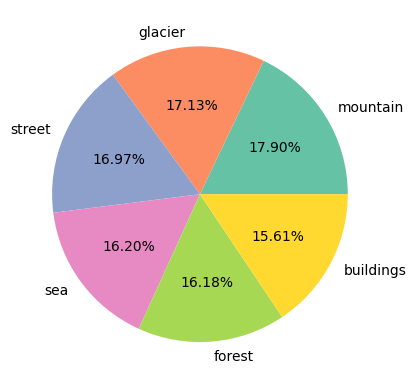

In [13]:
labels=train_df['Label'].value_counts().index
count=train_df['Label'].value_counts().values
plt.pie(count,labels=labels,autopct='%0.2f%%',colors=cm.Set2.colors)
plt.show()

In [14]:
train_df=tf.keras.utils.image_dataset_from_directory(train_dir,
                                                    validation_split=0.2,
                                                    subset="training",
                                                    seed=42,
                                                    image_size=(128,128),
                                                    batch_size=32,
                                                    label_mode='categorical'
                                                    )
test_df=tf.keras.utils.image_dataset_from_directory(test_dir,
                                                    seed=42,
                                                    image_size=(128,128),
                                                    batch_size=32,
                                                    label_mode='categorical'
                                                    )
val_df=tf.keras.utils.image_dataset_from_directory(train_dir,
                                                    validation_split=0.2,
                                                    subset="validation",
                                                    seed=42,
                                                    image_size=(128,128),
                                                    batch_size=32,
                                                    label_mode='categorical'
                                                    )

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 3000 files belonging to 6 classes.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.


In [15]:
test_df=test_df.map(lambda x,y:(x/255,y))
train_df=train_df.map(lambda x,y: (x/255,y))
val_df=val_df.map(lambda x,y: (x/255,y))

In [16]:
early_stopping=keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    start_from_epoch=10,
    verbose=1,
    patience=5
)
reduce_lr=keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1,
    min_delta=0.001,
    min_lr=1e-5

)

In [17]:
model=Sequential()
model.add(Conv2D(32,(3,3),activation='relu',input_shape=(128,128,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Conv2D(64,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Conv2D(128,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D())

model.add(Flatten())
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(6,activation='softmax'))

opt=Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',optimizer=opt,metrics=['accuracy'])

model.summary()

history=model.fit(train_df,epochs=30,validation_data=val_df,callbacks=[early_stopping,reduce_lr])


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 126, 126, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 61, 61, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 59, 59, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 59, 59, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 27, 27, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 27, 27, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 25, 25, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 25, 25, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     2,359,424 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,673,414 (10.20 MB)

 Trainable params: 2,672,582 (10.20 MB)

 Non-trainable params: 832 (3.25 KB)

Epoch 1/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 42s 87ms/step - accuracy: 0.4078 - loss: 1.5574 - val_accuracy: 0.2523 - val_loss: 2.6103 - learning_rate: 1.0000e-04
Epoch 2/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - accuracy: 0.6497 - loss: 0.9784 - val_accuracy: 0.7327 - val_loss: 0.7501 - learning_rate: 1.0000e-04
Epoch 3/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.7261 - loss: 0.7904 - val_accuracy: 0.7074 - val_loss: 0.8593 - learning_rate: 1.0000e-04
Epoch 4/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - accuracy: 0.7762 - loss: 0.6367 - val_accuracy: 0.7694 - val_loss: 0.6722 - learning_rate: 1.0000e-04
Epoch 5/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 33ms/step - accuracy: 0.7989 - loss: 0.5583 - val_accuracy: 0.7897 - val_loss: 0.6472 - learning_rate: 1.0000e-04
Epoch 6/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step - accuracy: 0.8315 - loss: 0.4798 - val_accuracy: 0.7719 - val_loss: 0.7669 - learning_rate: 1.0000e-04
Epoch 7/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/ste

In [18]:
from tabulate import tabulate
history_df = pd.DataFrame(history.history)
print(tabulate(history_df,headers='keys',tablefmt='psql'))

+----+------------+-----------+----------------+------------+-----------------+
|    |   accuracy |      loss |   val_accuracy |   val_loss |   learning_rate |
|----+------------+-----------+----------------+------------+-----------------|
|  0 |   0.510955 | 1.28698   |       0.252316 |   2.61033  |          0.0001 |
|  1 |   0.674207 | 0.919704  |       0.732716 |   0.75012  |          0.0001 |
|  2 |   0.742697 | 0.742208  |       0.707413 |   0.859349 |          0.0001 |
|  3 |   0.783933 | 0.62225   |       0.769423 |   0.672222 |          0.0001 |
|  4 |   0.810207 | 0.542369  |       0.789736 |   0.647218 |          0.0001 |
|  5 |   0.841111 | 0.457687  |       0.771917 |   0.766898 |          0.0001 |
|  6 |   0.867296 | 0.387865  |       0.786529 |   0.664816 |          0.0001 |
|  7 |   0.891165 | 0.321204  |       0.786885 |   0.690389 |          0.0001 |
|  8 |   0.906395 | 0.266376  |       0.790805 |   0.726272 |          0.0001 |
|  9 |   0.920021 | 0.230908  |       0.

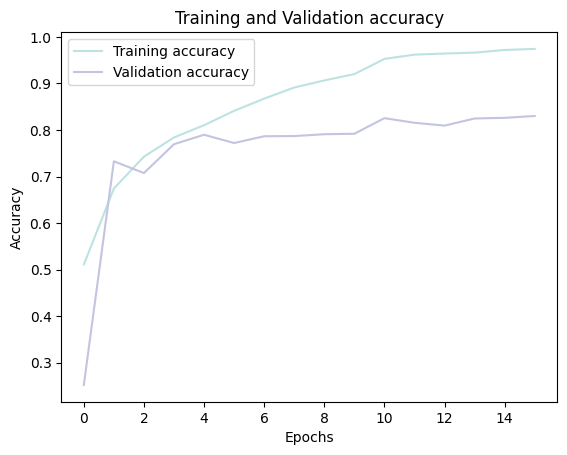

In [19]:
history_df = pd.DataFrame(history.history)

plt.plot(history_df.loc[:, ['accuracy']], "#BDE2E2", label='Training accuracy')
plt.plot(history_df.loc[:, ['val_accuracy']], "#C2C4E2", label='Validation accuracy')

plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

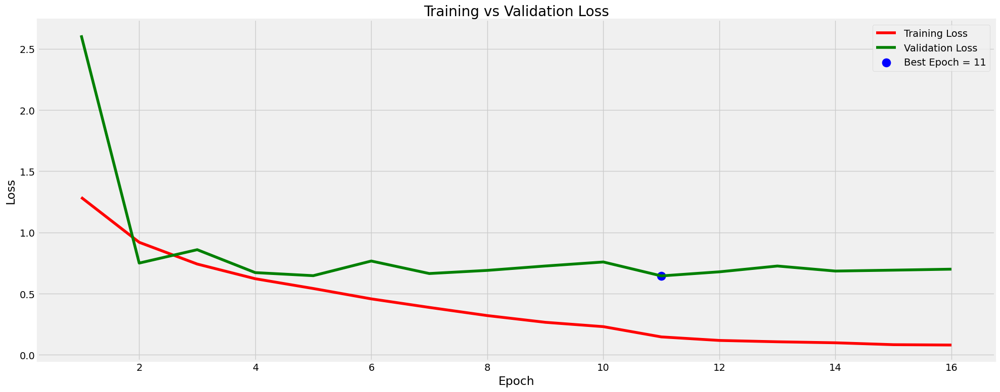


Best model found at epoch 11
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.8388 - loss: 0.6465

Test Performance:
Loss     : 0.68293
Accuracy : 82.50%


In [20]:
# Extract training and validation loss from history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Find the epoch with the lowest validation loss
best_epoch = np.argmin(val_loss)
best_val_loss = val_loss[best_epoch]

# Prepare x-axis (epochs) for the plot
epochs = [i + 1 for i in range(len(train_loss))]
highlight_label = f'Best Epoch = {best_epoch + 1}'

# Plot the loss curves
plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.scatter(best_epoch + 1, best_val_loss, s=150, c='blue', label=highlight_label)

plt.title('Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()


print(f"\nBest model found at epoch {best_epoch + 1}")

# Load and evaluate the best model
test_loss, test_accuracy = model.evaluate(test_df)

print("\nTest Performance:")
print(f"Loss     : {test_loss:.5f}")
print(f"Accuracy : {test_accuracy * 100:.2f}%")


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step


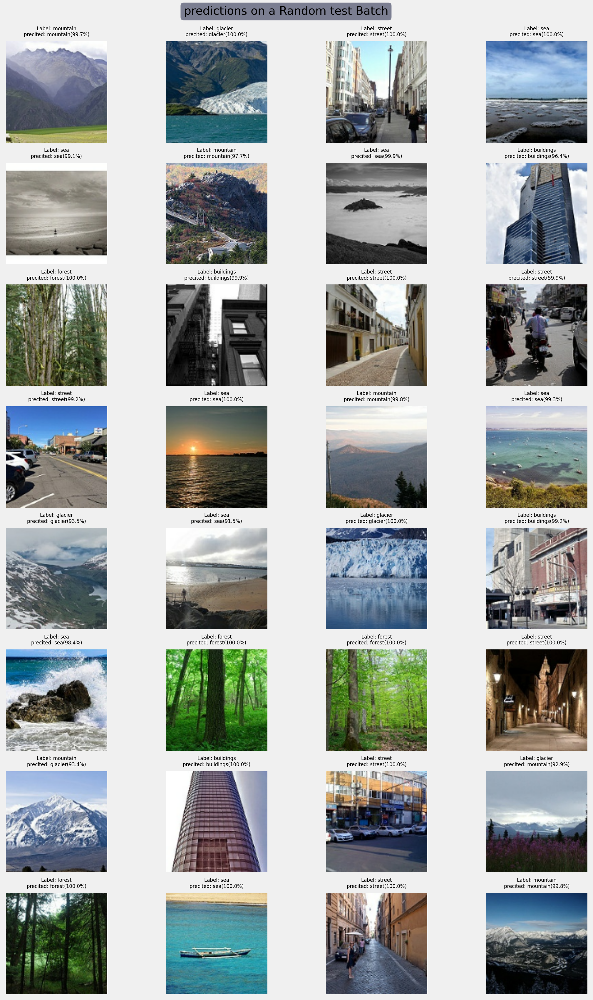

In [21]:
#visualizing test data
visual_test=test_df.map(lambda x,y:(x*255,y))#rescaling back to [0,255]

#get one batch from test dataset
test_batch=next(visual_test.as_numpy_iterator())
images,labels_one_hot=test_batch

images_for_pred=images/255.0

#predict using best model
pred_probs=model.predict(images_for_pred)
pred_classes=np.argmax(pred_probs,axis=1)
true_classes=np.argmax(labels_one_hot,axis=1)

#ploting images with prediction

fig,axes=plt.subplots(8,4,figsize=(12,20),dpi=200)
axes=axes.flatten()

plt.suptitle('predictions on a Random test Batch',fontsize=14,
             bbox=dict(facecolor='#4a4e69',alpha=0.7,boxstyle='round',pad=0.3),
             y=0.91)
for i,ax in enumerate(axes):
  ax.imshow(images[i].astype(int))
  ax.axis('off')
  ax.set_title(
      f"Label: {class_names[true_classes[i]]}\n"
      f"precited: {class_names[pred_classes[i]]}({100*np.max(pred_probs[i]):.1f}%)",
      fontsize=6
  )
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

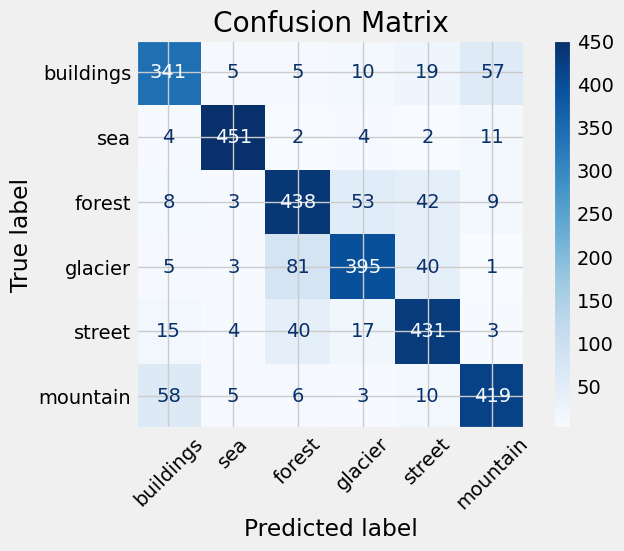

In [22]:
#confusion matrix and classification report
y_true=[]
y_pred=[]

#loop through batches in test dataset

for images,labels in test_df:
  preds=model.predict(images)

  #convert from  one_hot encoded labels to class_indices
  y_true.extend(np.argmax(labels.numpy(),axis=1))
  y_pred.extend(np.argmax(preds,axis=1))

class_names=['buildings', 'sea', 'forest', 'glacier', 'street', 'mountain']

#print classification report

print("CLassification Report\n")
print(classification_report(y_true,y_pred,target_names=class_names))

#plot confusion matrix
cm=confusion_matrix(y_true,y_pred)
disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_names)
disp.plot(cmap=plt.cm.Blues,xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

Model Training using VGG16

In [23]:
from tensorflow.keras.applications import VGG16

# initializing convolutional base of vgg16
base_model=VGG16(weights='imagenet',input_shape=(128,128,3),include_top=False)
base_model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
earlystop=keras.callbacks.EarlyStopping(
    monitor='val_loss',patience=10, restore_best_weights=True,verbose=1
)
modelcheck=keras.callbacks.ModelCheckpoint(filepath='model_checkpoint_epoch_{epoch:02d}.keras',save_best_only=True)


In [25]:
#adding custom layers on top of VGG16 base model
model2=Sequential()
model2.add(base_model)
model2.add(Flatten())
model2.add(Dense(256,activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(128,activation='relu'))
model2.add(Dense(6,activation='softmax'))
model2.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

model2.summary()

history2=model2.fit(train_df,epochs=30,validation_data=val_df,callbacks=[earlystop,modelcheck])



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,845,766 (64.26 MB)

 Trainable params: 16,845,766 (64.26 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 119s 276ms/step - accuracy: 0.2487 - loss: 1.6933 - val_accuracy: 0.6058 - val_loss: 0.9709
Epoch 2/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 182ms/step - accuracy: 0.5819 - loss: 1.0246 - val_accuracy: 0.6051 - val_loss: 1.0515
Epoch 3/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 184ms/step - accuracy: 0.6237 - loss: 0.9408 - val_accuracy: 0.7373 - val_loss: 0.7190
Epoch 4/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 183ms/step - accuracy: 0.7095 - loss: 0.7930 - val_accuracy: 0.7495 - val_loss: 0.7007
Epoch 5/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 185ms/step - accuracy: 0.7646 - loss: 0.6644 - val_accuracy: 0.7887 - val_loss: 0.5730
Epoch 6/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 183ms/step - accuracy: 0.7891 - loss: 0.5912 - val_accuracy: 0.7990 - val_loss: 0.5488
Epoch 7/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 82s 184ms/step - accuracy: 0.8019 - loss: 0.5522 - val_accuracy: 0.8250 - val_loss: 0.5116
Epoch 8/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 182ms/step - accuracy: 0.8226 - loss: 

In [26]:
history2_df = pd.DataFrame(history2.history)
print(tabulate(history2_df,headers='keys',tablefmt='psql'))

+----+------------+----------+----------------+------------+
|    |   accuracy |     loss |   val_accuracy |   val_loss |
|----+------------+----------+----------------+------------|
|  0 |   0.377805 | 1.41481  |       0.605845 |   0.970921 |
|  1 |   0.607855 | 0.977927 |       0.605132 |   1.05149  |
|  2 |   0.654792 | 0.88742  |       0.737349 |   0.718971 |
|  3 |   0.724973 | 0.75721  |       0.749465 |   0.700714 |
|  4 |   0.773156 | 0.643751 |       0.788667 |   0.573041 |
|  5 |   0.79088  | 0.588719 |       0.799002 |   0.548757 |
|  6 |   0.809761 | 0.534596 |       0.825018 |   0.511644 |
|  7 |   0.826416 | 0.500872 |       0.816465 |   0.536511 |
|  8 |   0.832116 | 0.474265 |       0.820028 |   0.533918 |
|  9 |   0.839954 | 0.467248 |       0.832858 |   0.495685 |
| 10 |   0.850998 | 0.429484 |       0.837491 |   0.521311 |
| 11 |   0.863555 | 0.400804 |       0.842837 |   0.476286 |
| 12 |   0.868098 | 0.378807 |       0.857448 |   0.464304 |
| 13 |   0.873709 | 0.36

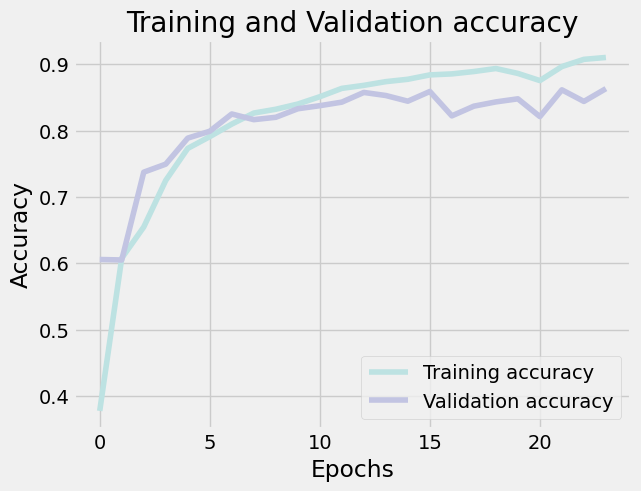

In [27]:
history2_df = pd.DataFrame(history2.history)

plt.plot(history2_df.loc[:, ['accuracy']], "#BDE2E2", label='Training accuracy')
plt.plot(history2_df.loc[:, ['val_accuracy']], "#C2C4E2", label='Validation accuracy')

plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

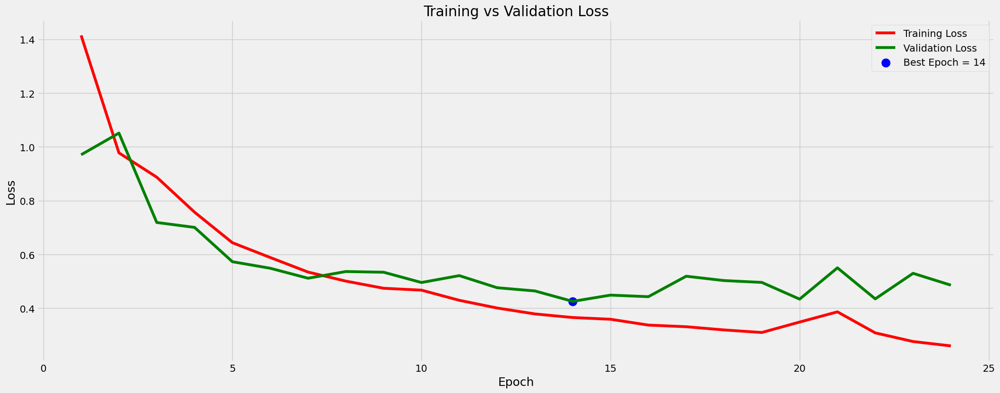


Best model found at epoch 14
Loading model: model_checkpoint_epoch_13.keras
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 105ms/step - accuracy: 0.8546 - loss: 0.4656

Test Performance:
Loss     : 0.47787
Accuracy : 85.03%


In [28]:
# Extract training and validation loss from history
train_loss = history2.history['loss']
val_loss = history2.history['val_loss']

# Find the epoch with the lowest validation loss
best_epoch = np.argmin(val_loss)
best_val_loss = val_loss[best_epoch]

# Prepare x-axis (epochs) for the plot
epochs = [i + 1 for i in range(len(train_loss))]
highlight_label = f'Best Epoch = {best_epoch + 1}'

# Plot the loss curves
plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.plot(epochs, train_loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'g', label='Validation Loss')
plt.scatter(best_epoch + 1, best_val_loss, s=150, c='blue', label=highlight_label)

plt.title('Training vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Build the filename of the best model
model_filename = f'model_checkpoint_epoch_{best_epoch:02d}.keras'

print(f"\nBest model found at epoch {best_epoch + 1}")
print(f"Loading model: {model_filename}")

# Load and evaluate the best model
best_model = keras.models.load_model(model_filename)
test_loss, test_accuracy = best_model.evaluate(test_df)

print("\nTest Performance:")
print(f"Loss     : {test_loss:.5f}")
print(f"Accuracy : {test_accuracy * 100:.2f}%")


In [29]:
print(model_filename)

model_checkpoint_epoch_13.keras


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step


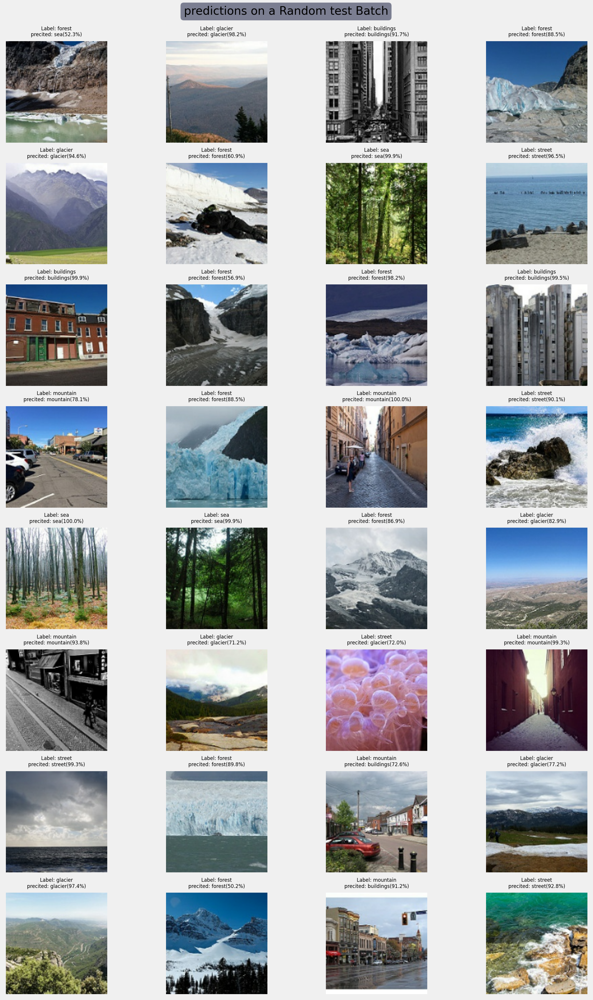

In [32]:
#visualizing test data
visual_test=test_df.map(lambda x,y:(x*255,y))#rescaling back to [0,255]

#get one batch from test dataset
test_batch=next(visual_test.as_numpy_iterator())
images,labels_one_hot=test_batch

images_for_pred=images/255.0

#predict using best model
pred_probs=model2.predict(images_for_pred)
pred_classes=np.argmax(pred_probs,axis=1)
true_classes=np.argmax(labels_one_hot,axis=1)

#ploting images with prediction

fig,axes=plt.subplots(8,4,figsize=(12,20),dpi=200)
axes=axes.flatten()

plt.suptitle('predictions on a Random test Batch',fontsize=14,
             bbox=dict(facecolor='#4a4e69',alpha=0.7,boxstyle='round',pad=0.3),
             y=0.91)
for i,ax in enumerate(axes):
  ax.imshow(images[i].astype(int))
  ax.axis('off')
  ax.set_title(
      f"Label: {class_names[true_classes[i]]}\n"
      f"precited: {class_names[pred_classes[i]]}({100*np.max(pred_probs[i]):.1f}%)",
      fontsize=6
  )
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11

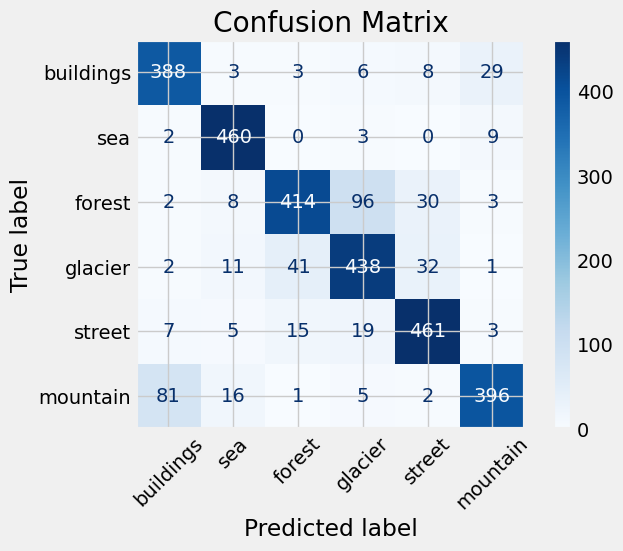

In [31]:
#confusion matrix and classification report
y_true=[]
y_pred=[]

#loop through batches in test dataset

for images,labels in test_df:
  preds=model2.predict(images)

  #convert from  one_hot encoded labels to class_indices
  y_true.extend(np.argmax(labels.numpy(),axis=1))
  y_pred.extend(np.argmax(preds,axis=1))

class_names=['buildings', 'sea', 'forest', 'glacier', 'street', 'mountain']

#print classification report

print("CLassification Report\n")
print(classification_report(y_true,y_pred,target_names=class_names))

#plot confusion matrix
cm=confusion_matrix(y_true,y_pred)
disp=ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_names)
disp.plot(cmap=plt.cm.Blues,xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

In [ ]:
!jupyter nbconvert --to html Intel_CNN.ipynb
